# Imports

In [1]:
import sys
import os
import uproot

# Añade el directorio padre al sys.path
sys.path.append(os.path.abspath("/mnt/netapp2/Store_uni/home/usc/ie/dcr/software/hk"))

import hipy.hipy.pltext  as pltext
import matplotlib.pyplot as plt
import awkward           as ak
import numpy             as np
import pandas            as pd

from nHits_trigger.src.read_data          import nHits, read_mpmt_offsets
from WCTE_BRB_Data_Analysis.wcte.brbtools import sort_run_files, get_part_files
from matplotlib.backends.backend_pdf      import PdfPages

from tqdm import tqdm

plt.style.use('default');
pltext.style()

# Read Data And Correct TOF

In [2]:
bkg_run = 1766

bkg_run_files  = sort_run_files(f"/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/hk/raw_data/production_v0/{bkg_run}/WCTE_offline_R{bkg_run}S*P*.root")
bkg_part_files = get_part_files(bkg_run_files)

# Run Variables
bkg_run_corrected_times           = []
bkg_run_hit_charges               = []
bkg_run_hit_card_ids              = []
bkg_run_hit_channel_ids           = []
bkg_run_hit_slot_ids              = []
bkg_run_hit_position_ids          = []
bkg_run_hit_pmt_has_time_constant = []

ev_offset = 0
for part in bkg_part_files[:1]:
    print(f"Processing part WCTE_offline_R{bkg_run}S0P{part}")
    bkg_tree = uproot.open(bkg_run_files[part] + ":WCTEReadoutWindows")
    
    # Read the variables
    bkg_file_hit_card_ids              = ak.values_astype(bkg_tree["hit_mpmt_card_ids"]        .array(), np.int16)
    bkg_file_hit_channel_ids           = ak.values_astype(bkg_tree["hit_pmt_channel_ids"]      .array(), np.int8)
    bkg_file_hit_times                 = ak.values_astype(bkg_tree["hit_pmt_times"]            .array(), np.float64)
    bkg_file_hit_times_calib           = ak.values_astype(bkg_tree["hit_pmt_calibrated_times"] .array(), np.float64)
    bkg_file_hit_charges               = ak.values_astype(bkg_tree["hit_pmt_charges"]          .array(), np.float64)
    bkg_file_hit_slot_ids              = ak.values_astype(bkg_tree["hit_mpmt_slot_ids"]        .array(), np.int16)
    bkg_file_hit_position_ids          = ak.values_astype(bkg_tree["hit_pmt_position_ids"]     .array(), np.int16)
    bkg_file_hit_pmt_has_time_constant = ak.values_astype(bkg_tree["hit_pmt_has_time_constant"].array(), np.bool)

    mpmt_map = read_mpmt_offsets("/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/hk/mpmt_tof_map/mpmt_tof_pos1767_v2.json")

    max_slot = 106
    max_pos  = 19

    # Build lookup
    lookup = np.zeros((max_slot, max_pos))
    for (card, chan), shift in mpmt_map.items():
        lookup[card, chan] = shift

    # Hit Times Correction
    bkg_flat_slot_ids     = ak.ravel(bkg_file_hit_slot_ids)
    bkg_flat_pos_ids      = ak.ravel(bkg_file_hit_position_ids)
    bkg_flat_corrections  = lookup[bkg_flat_slot_ids, bkg_flat_pos_ids]
    bkg_corrections       = ak.unflatten(bkg_flat_corrections, ak.num(bkg_file_hit_card_ids))

    bkg_term1           = bkg_file_hit_times_calib
    bkg_corrected_times = bkg_term1# - bkg_corrections 

    # Filter Out Main Things
    mask = (bkg_file_hit_charges < 1e4) & (bkg_file_hit_card_ids < 120) & (bkg_file_hit_pmt_has_time_constant != 0)
    bkg_corrected_times                = bkg_corrected_times                [mask]
    bkg_file_hit_charges               = bkg_file_hit_charges               [mask]
    bkg_file_hit_card_ids              = bkg_file_hit_card_ids              [mask]
    bkg_file_hit_channel_ids           = bkg_file_hit_channel_ids           [mask]
    bkg_file_hit_slot_ids              = bkg_file_hit_slot_ids              [mask]
    bkg_file_hit_position_ids          = bkg_file_hit_position_ids          [mask]
    bkg_file_hit_pmt_has_time_constant = bkg_file_hit_pmt_has_time_constant [mask]

    # SUPER IMPORTANT! We want the hit time time-ordered, and we want to order the other variables the same way so later we can filter out by index in the array
    order = ak.argsort(bkg_corrected_times)
    
    bkg_run_corrected_times          .append(bkg_corrected_times               [order])
    bkg_run_hit_charges              .append(bkg_file_hit_charges              [order])
    bkg_run_hit_card_ids             .append(bkg_file_hit_card_ids             [order])    
    bkg_run_hit_channel_ids          .append(bkg_file_hit_channel_ids          [order]) 
    bkg_run_hit_slot_ids             .append(bkg_file_hit_slot_ids             [order])    
    bkg_run_hit_position_ids         .append(bkg_file_hit_position_ids         [order])
    bkg_run_hit_pmt_has_time_constant.append(bkg_file_hit_pmt_has_time_constant[order])

bkg_run_corrected_times           = ak.concatenate(bkg_run_corrected_times          )
bkg_run_hit_charges               = ak.concatenate(bkg_run_hit_charges              )
bkg_run_hit_card_ids              = ak.concatenate(bkg_run_hit_card_ids             )
bkg_run_hit_channel_ids           = ak.concatenate(bkg_run_hit_channel_ids          )
bkg_run_hit_slot_ids              = ak.concatenate(bkg_run_hit_slot_ids             )
bkg_run_hit_position_ids          = ak.concatenate(bkg_run_hit_position_ids         )
bkg_run_hit_pmt_has_time_constant = ak.concatenate(bkg_run_hit_pmt_has_time_constant)

Processing part WCTE_offline_R1766S0P0


In [3]:
nicf_run = 1767

nicf_run_files  = sort_run_files(f"/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/hk/raw_data/production_v0/{nicf_run}/WCTE_offline_R{nicf_run}S*P*.root")
nicf_part_files = get_part_files(nicf_run_files)

# Run Variables
nicf_run_tof_corrected_times           = []
nicf_run_tof_hit_charges               = []
nicf_run_tof_hit_card_ids              = []
nicf_run_tof_hit_channel_ids           = []
nicf_run_tof_hit_slot_ids              = []
nicf_run_tof_hit_position_ids          = []
nicf_run_tof_hit_pmt_has_time_constant = []

ev_offset = 0
for part in nicf_part_files[:1]:
    print(f"Processing part WCTE_offline_R{nicf_run}S0P{part}")
    nicf_tree = uproot.open(nicf_run_files[part] + ":WCTEReadoutWindows")
    
    # Read the variables
    nicf_file_hit_card_ids              = ak.values_astype(nicf_tree["hit_mpmt_card_ids"]        .array(), np.int16)
    nicf_file_hit_channel_ids           = ak.values_astype(nicf_tree["hit_pmt_channel_ids"]      .array(), np.int8)
    nicf_file_hit_times                 = ak.values_astype(nicf_tree["hit_pmt_times"]            .array(), np.float64)
    nicf_file_hit_times_calib           = ak.values_astype(nicf_tree["hit_pmt_calibrated_times"] .array(), np.float64)
    nicf_file_hit_charges               = ak.values_astype(nicf_tree["hit_pmt_charges"]          .array(), np.float64)
    nicf_file_hit_slot_ids              = ak.values_astype(nicf_tree["hit_mpmt_slot_ids"]        .array(), np.int16)
    nicf_file_hit_position_ids          = ak.values_astype(nicf_tree["hit_pmt_position_ids"]     .array(), np.int16)
    nicf_file_hit_pmt_has_time_constant = ak.values_astype(nicf_tree["hit_pmt_has_time_constant"].array(), np.bool)

    mpmt_map = read_mpmt_offsets("/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/hk/mpmt_tof_map/mpmt_tof_pos1767_v2.json")

    max_slot = 106
    max_pos  = 19

    # Build lookup
    lookup = np.zeros((max_slot, max_pos))
    for (card, chan), shift in mpmt_map.items():
        lookup[card, chan] = shift

    # Hit Times Correction
    nicf_flat_slot_ids     = ak.ravel(nicf_file_hit_slot_ids)
    nicf_flat_pos_ids      = ak.ravel(nicf_file_hit_position_ids)
    nicf_flat_corrections  = lookup[nicf_flat_slot_ids, nicf_flat_pos_ids]
    nicf_corrections       = ak.unflatten(nicf_flat_corrections, ak.num(nicf_file_hit_card_ids))

    nicf_term1           = nicf_file_hit_times_calib
    nicf_corrected_times = nicf_term1# - nicf_corrections 

    # Filter Out Main Things
    mask = (nicf_file_hit_charges < 1e4) & (nicf_file_hit_card_ids < 120) & (nicf_file_hit_pmt_has_time_constant != 0)
    nicf_corrected_times                = nicf_corrected_times                [mask]
    nicf_file_hit_charges               = nicf_file_hit_charges               [mask]
    nicf_file_hit_card_ids              = nicf_file_hit_card_ids              [mask]
    nicf_file_hit_channel_ids           = nicf_file_hit_channel_ids           [mask]
    nicf_file_hit_slot_ids              = nicf_file_hit_slot_ids              [mask]
    nicf_file_hit_position_ids          = nicf_file_hit_position_ids          [mask]
    nicf_file_hit_pmt_has_time_constant = nicf_file_hit_pmt_has_time_constant [mask]

    # SUPER IMPORTANT! We want the hit time time-ordered, and we want to order the other variables the same way so later we can filter out by index in the array
    order = ak.argsort(nicf_corrected_times)
    
    nicf_run_tof_corrected_times          .append(nicf_corrected_times               [order])
    nicf_run_tof_hit_charges              .append(nicf_file_hit_charges              [order])
    nicf_run_tof_hit_card_ids             .append(nicf_file_hit_card_ids             [order])    
    nicf_run_tof_hit_channel_ids          .append(nicf_file_hit_channel_ids          [order]) 
    nicf_run_tof_hit_slot_ids             .append(nicf_file_hit_slot_ids             [order])    
    nicf_run_tof_hit_position_ids         .append(nicf_file_hit_position_ids         [order])
    nicf_run_tof_hit_pmt_has_time_constant.append(nicf_file_hit_pmt_has_time_constant[order])

nicf_run_tof_corrected_times           = ak.concatenate(nicf_run_tof_corrected_times          )
nicf_run_tof_hit_charges               = ak.concatenate(nicf_run_tof_hit_charges              )
nicf_run_tof_hit_card_ids              = ak.concatenate(nicf_run_tof_hit_card_ids             )
nicf_run_tof_hit_channel_ids           = ak.concatenate(nicf_run_tof_hit_channel_ids          )
nicf_run_tof_hit_slot_ids              = ak.concatenate(nicf_run_tof_hit_slot_ids             )
nicf_run_tof_hit_position_ids          = ak.concatenate(nicf_run_tof_hit_position_ids         )
nicf_run_tof_hit_pmt_has_time_constant = ak.concatenate(nicf_run_tof_hit_pmt_has_time_constant)

Processing part WCTE_offline_R1767S0P0


# nHits Trigger

In [4]:
def nHits_greedy(hit_times,
                 w,
                 thresh_min,
                 thresh_max=None,
                 jump=0,
                 mode="multiple_events",
                 event=0,
                 progress_bar=True):
    """
    nHits trigger con extensión greedy hacia adelante.

    La sliding window recorre el evento. Cuando encuentra un cluster >= thresh_min:
      - Extiende la ventana hacia adelante en pasos de 'w' ns mientras haya hits.
      - Para cuando la siguiente ventana [last_hit, last_hit + w] está vacía.
      - Guarda todos los hits acumulados como un único candidato.
    
    Parámetros
    ----------
    hit_times   : awkward array de hit times por evento
    w           : ancho de la sliding window [ns]
    thresh_min  : mínimo de hits para triggar
    thresh_max  : máximo de hits permitidos (None = sin límite)
    jump        : deadtime mínimo entre el fin de un candidato y el seed del siguiente [ns]
    mode        : "single_event" | "multiple_events"
    event       : índice del evento (solo para mode="single_event")
    progress_bar: mostrar barra de progreso en modo múltiple
    """

    def process_event(ht, w, thresh_min, thresh_max, jump):

        if len(ht) == 0:
            return [], [], []

        ht = np.sort(ht)
        n  = len(ht)

        # Sliding window vectorizada: counts[i] = hits en [ht[i], ht[i] + w)
        ends   = ht + w
        right  = np.searchsorted(ht, ends, side="left")
        counts = right - np.arange(n)

        candidate_indices = []
        candidate_times   = []
        trigger_seeds     = []

        last_cluster_end = -np.inf
        i = 0

        while i < n:

            # --- Deadtime ---
            if ht[i] < last_cluster_end + jump:
                i += 1
                continue

            # --- ¿Trigger? ---
            if counts[i] < thresh_min:
                i += 1
                continue

            # thresh_max solo filtra el seed inicial, no el candidato extendido
            if thresh_max is not None and counts[i] > thresh_max:
                i += 1
                continue

            # --- Trigger en ht[i] ---
            seed = ht[i]

            # La primera ventana recoge hits en [ht[i], ht[i] + w)
            # right[i] es el primer índice FUERA de esa ventana
            window_start_idx = i
            window_end_idx   = right[i]   # exclusivo

            # collected_end marca hasta dónde hemos recogido (exclusivo)
            collected_end = window_end_idx

            # --- Extensión greedy ---
            # Arrancamos desde el último hit recogido y buscamos hits
            # en [t_last_hit, t_last_hit + w). Si hay, extendemos.
            while collected_end < n:
                t_last_hit      = ht[collected_end - 1]          # último hit recogido
                next_window_end = t_last_hit + w                 # fin de la ventana siguiente

                # ¿Hay algún hit en (t_last_hit, t_last_hit + w)?
                # next_start = collected_end porque ht[collected_end-1] ya está recogido
                next_end = np.searchsorted(ht, next_window_end, side="left")

                if next_end > collected_end:
                    # Hay hits nuevos → extendemos
                    collected_end = next_end
                else:
                    # Ventana vacía → paramos
                    break

            # --- Guardar candidato ---
            indices_roi   = np.arange(window_start_idx, collected_end)
            hit_times_roi = ht[indices_roi]

            candidate_indices.append(indices_roi)
            candidate_times.append(hit_times_roi)
            trigger_seeds.append(seed)

            last_cluster_end = hit_times_roi[-1]
            i = collected_end   # saltamos al primer hit no recogido

        return candidate_indices, candidate_times, trigger_seeds
    
    # ------------------------------------------------------------------
    # SINGLE EVENT
    # ------------------------------------------------------------------

    if mode == "single_event":

        ht = ak.to_numpy(hit_times[event])
        idxs, times, seeds = process_event(ht, w, thresh_min, thresh_max, jump)

        return {event: idxs}, {event: times}, {event: seeds}

    # ------------------------------------------------------------------
    # MULTIPLE EVENTS
    # ------------------------------------------------------------------

    elif mode == "multiple_events":

        nevents = len(hit_times)

        all_indices = {}
        all_times   = {}
        all_seeds   = {}

        for ev in tqdm(range(nevents), total=nevents, disable=not progress_bar):

            ht = ak.to_numpy(hit_times[ev])

            if len(ht) == 0:
                all_indices[ev] = []
                all_times[ev]   = []
                all_seeds[ev]   = []
                continue

            idxs, times, seeds = process_event(ht, w, thresh_min, thresh_max, jump)

            all_indices[ev] = idxs
            all_times[ev]   = times
            all_seeds[ev]   = seeds

        return all_indices, all_times, all_seeds

    else:
        raise ValueError(f"Modo no válido: '{mode}'. Usa 'single_event' o 'multiple_events'.")


In [5]:
nicf_indices, nicf_times, nicf_seeds = nHits_greedy(nicf_run_tof_corrected_times, w=20, thresh_min=2, thresh_max=np.inf)
bkg_indices, bkg_times, bkg_seeds    = nHits_greedy(bkg_run_corrected_times,      w=20, thresh_min=2, thresh_max=np.inf)

  0%|          | 0/11113 [00:00<?, ?it/s]

100%|██████████| 11113/11113 [00:05<00:00, 2189.50it/s]


# Basic Plots

### nHits

In [27]:
window_length_sig = []
number_ofhits_sig = []

for evCandidates in tqdm(nicf_times.values(), total=len(nicf_times.values())):
    for candidate in evCandidates:
        window_length_sig.append(np.max(candidate)-np.min(candidate))
        number_ofhits_sig.append(len(candidate))
        
window_length_bkg = []
number_ofhits_bkg = []

for evCandidates in tqdm(bkg_times.values(), total=len(bkg_times.values())):
    for candidate in evCandidates:
        window_length_bkg.append(np.max(candidate)-np.min(candidate))
        number_ofhits_bkg.append(len(candidate))

100%|██████████| 29108/29108 [00:04<00:00, 6400.65it/s]


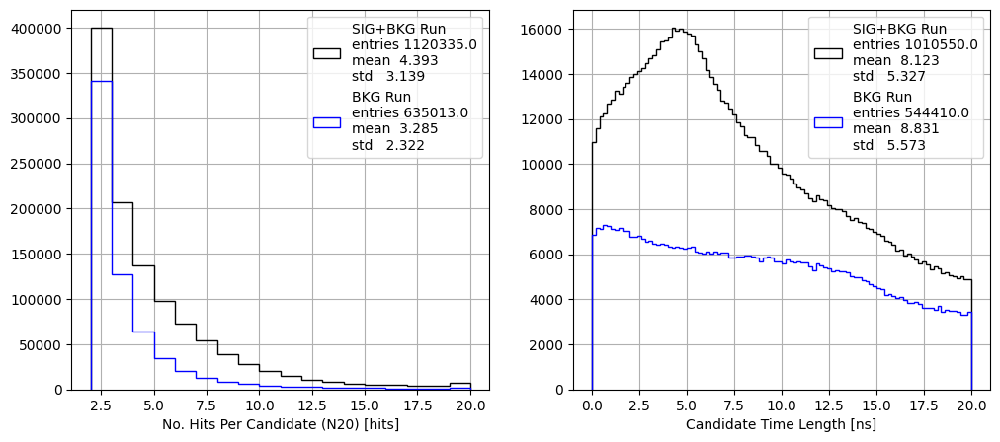

In [28]:
subplot = pltext.canvas(2)

subplot(1)
pltext.hist(number_ofhits_sig, 18, ylog=False, range=(2, 20), xylabels="No. Hits Per Candidate (N20) [hits]", label="SIG+BKG Run");
pltext.hist(number_ofhits_bkg, 18, ylog=False, range=(2, 20), xylabels="No. Hits Per Candidate (N20) [hits]", label="BKG Run");

subplot(2)
pltext.hist(window_length_sig, 100, ylog=False, range=(0, 20), xylabels="Candidate Time Length [ns]", label="SIG+BKG Run");
pltext.hist(window_length_bkg, 100, ylog=False, range=(0, 20), xylabels="Candidate Time Length [ns]", label="BKG Run");

In [29]:
# subplot = pltext.canvas(2)

# subplot(1)
# plt.scatter(number_ofhits_sig, window_length_sig, s=3, alpha=0.01, label="SIG+BKG Run");
# plt.xlabel("No. Hits Per Candidate (N20) [hits]");
# plt.ylabel("Candidate Time Length [ns]")
# plt.xlim(0, 100);
# plt.ylim(0, 200);
# plt.legend();

# subplot(2)
# plt.scatter(number_ofhits_bkg, window_length_bkg, s=3, alpha=0.01, label="BKG Run");
# plt.xlabel("No. Hits Per Candidate (N20) [hits]");
# plt.ylabel("Candidate Time Length [ns]")
# plt.xlim(0, 100);
# plt.ylim(0, 200);
# plt.legend();

### tRMS

In [30]:
tRMS_sig_tot = []
for evCandidates in tqdm(nicf_times.values(), total=len(nicf_times.values())):
    for candidate in evCandidates:
           tRMS_sig_tot.append(np.std(candidate))

tRMS_bkg_tot = []
for evCandidates in tqdm(bkg_times.values(), total=len(bkg_times.values())):
    for candidate in evCandidates:
           tRMS_bkg_tot.append(np.std(candidate))

  1%|          | 290/29108 [00:00<00:20, 1407.42it/s]

100%|██████████| 29108/29108 [00:11<00:00, 2585.60it/s]


In [31]:
tRMS_sig = []
for evCandidates in tqdm(nicf_times.values(), total=len(nicf_times.values())):
    for candidate in evCandidates:
       if len(candidate) <= 20:
           tRMS_sig.append(np.std(candidate))

tRMS_bkg = []
for evCandidates in tqdm(bkg_times.values(), total=len(bkg_times.values())):
    for candidate in evCandidates:
       if len(candidate) <= 20:
           tRMS_bkg.append(np.std(candidate))

100%|██████████| 29108/29108 [00:10<00:00, 2717.64it/s]


In [32]:
tRMS_sig_less10 = []
for evCandidates in tqdm(nicf_times.values(), total=len(nicf_times.values())):
    for candidate in evCandidates:
       if len(candidate) <= 10:
           tRMS_sig_less10.append(np.std(candidate))

tRMS_bkg_less10 = []
for evCandidates in tqdm(bkg_times.values(), total=len(bkg_times.values())):
    for candidate in evCandidates:
       if len(candidate) <= 10:
           tRMS_bkg_less10.append(np.std(candidate))

100%|██████████| 29108/29108 [00:10<00:00, 2722.93it/s]


In [33]:
tRMS_sig_10_20 = []
for evCandidates in tqdm(nicf_times.values(), total=len(nicf_times.values())):
    for candidate in evCandidates:
       if len(candidate) >= 10 and len(candidate) <= 20:
           tRMS_sig_10_20.append(np.std(candidate))

tRMS_bkg_10_20 = []
for evCandidates in tqdm(bkg_times.values(), total=len(bkg_times.values())):
    for candidate in evCandidates:
       if len(candidate) >= 10 and len(candidate) <= 20:
           tRMS_bkg_10_20.append(np.std(candidate))

  0%|          | 0/29108 [00:00<?, ?it/s]

100%|██████████| 29108/29108 [00:00<00:00, 62929.65it/s]


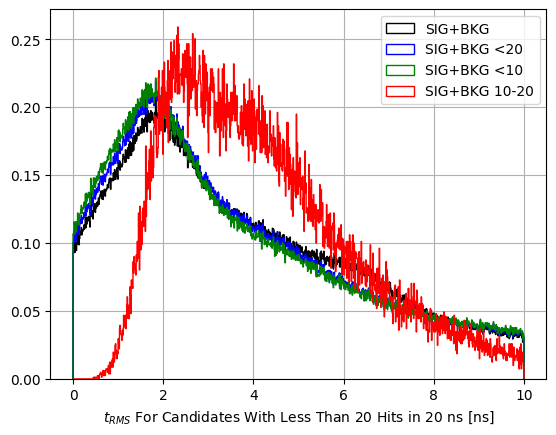

In [34]:
pltext.hist(tRMS_sig_tot,    1000, range=(0, 10), stats=False, density=True, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="SIG+BKG");
pltext.hist(tRMS_sig,        1000, range=(0, 10), stats=False, density=True, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="SIG+BKG <20");
pltext.hist(tRMS_sig_less10, 1000, range=(0, 10), stats=False, density=True, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="SIG+BKG <10");
pltext.hist(tRMS_sig_10_20,  1000, range=(0, 10), stats=False, density=True, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="SIG+BKG 10-20");
# pltext.hist(tRMS_bkg,        100, range=(0, 10), stats=False, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="BKG Run");
# pltext.hist(tRMS_bkg_less10, 100, range=(0, 10), stats=False, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="BKG Run <20");
# pltext.hist(tRMS_bkg_10_20,  100, range=(0, 10), stats=False, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="BKG Run <10");

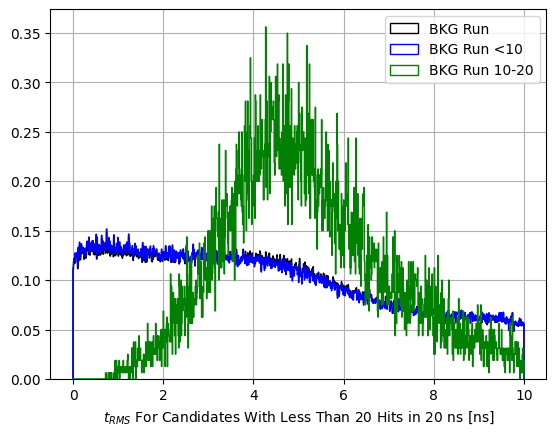

In [35]:
pltext.hist(tRMS_bkg,        1000, range=(0, 10), stats=False, density=True, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="BKG Run");
pltext.hist(tRMS_bkg_less10, 1000, range=(0, 10), stats=False, density=True, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="BKG Run <10");
pltext.hist(tRMS_bkg_10_20,  1000, range=(0, 10), stats=False, density=True, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="BKG Run 10-20");

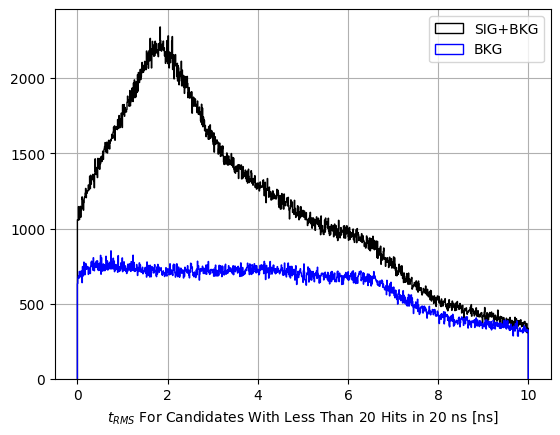

In [36]:
pltext.hist(tRMS_sig_tot, 1000, range=(0, 10), stats=False, density=False, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="SIG+BKG");
pltext.hist(tRMS_bkg_tot, 1000, range=(0, 10), stats=False, density=False, xylabels="$t_{RMS}$ For Candidates With Less Than 20 Hits in 20 ns [ns]", label="BKG");

### tRMS vs. 

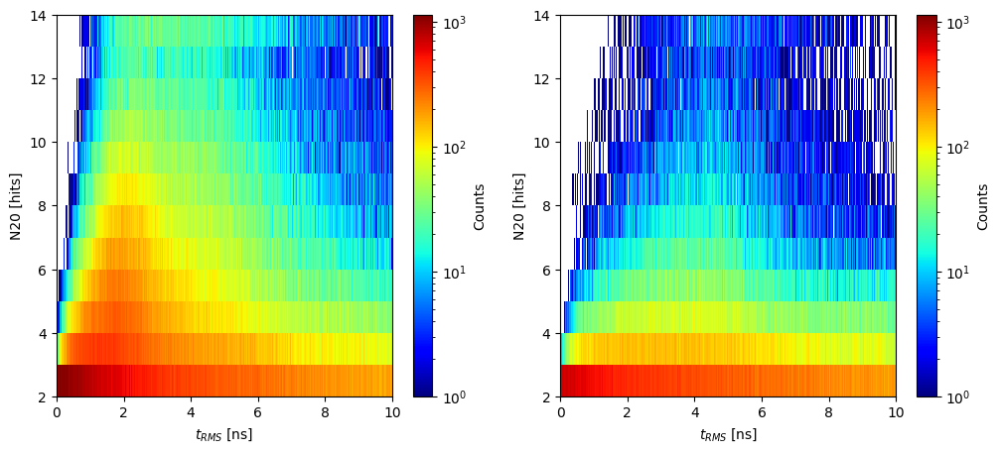

In [37]:
import matplotlib.colors as mcolors

# Calcular el rango del primero
counts_sig, _, _ = np.histogram2d(tRMS_sig_tot, number_ofhits_sig, 
                                   bins=(1000, 12), range=((0,10), (2,14)))
vmin = counts_sig[counts_sig > 0].min()  # mínimo no nulo (importante con norm="log")
vmax = counts_sig.max()

norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

subplot = pltext.canvas(2)
subplot(1)
_, _, _, img1 = plt.hist2d(tRMS_sig_tot, number_ofhits_sig, (1000, 12), 
                            range=((0,10), (2,14)), norm=norm, cmap="jet")
plt.colorbar(img1, label="Counts")
plt.xlabel("$t_{RMS}$ [ns]")
plt.ylabel("N20 [hits]")

subplot(2)
_, _, _, img2 = plt.hist2d(tRMS_bkg_tot, number_ofhits_bkg, (1000, 12), 
                            range=((0,10), (2,14)), norm=norm, cmap="jet")
plt.colorbar(img2, label="Counts")
plt.xlabel("$t_{RMS}$ [ns]")
plt.ylabel("N20 [hits]");

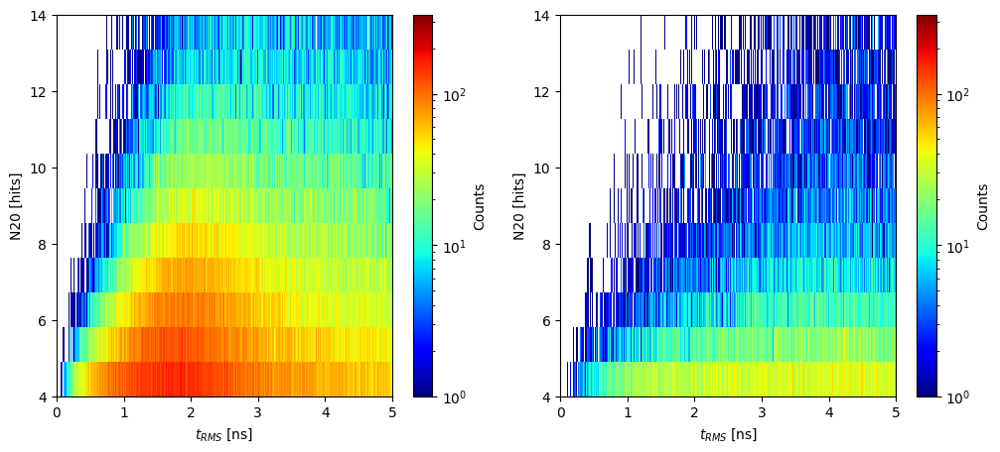

In [38]:
import matplotlib.colors as mcolors

# Calcular el rango del primero
counts_sig, _, _ = np.histogram2d(tRMS_sig_tot, number_ofhits_sig, 
                                   bins=(1000, 12), range=((0,10), (2,14)))
vmin = counts_sig[counts_sig > 0].min()  # mínimo no nulo (importante con norm="log")
vmax = counts_sig.max()

norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

# Máscaras
nhitMask_sig = np.array(number_ofhits_sig) > 3
trmsMask_sig = np.array(tRMS_sig_tot) < 5
combinedMask_sig = nhitMask_sig & trmsMask_sig

nhitMask_bkg = np.array(number_ofhits_bkg) > 3
trmsMask_bkg = np.array(tRMS_bkg_tot) < 5
combinedMask_bkg = nhitMask_bkg & trmsMask_bkg

# Recalcular norma con los datos ya filtrados
counts_sig, _, _ = np.histogram2d(np.array(tRMS_sig_tot)[combinedMask_sig], 
                                   np.array(number_ofhits_sig)[combinedMask_sig], 
                                   bins=(1000, 12), range=((0,10), (2,14)))
vmin = counts_sig[counts_sig > 0].min()
vmax = counts_sig.max()
norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

subplot = pltext.canvas(2)
subplot(1)
_, _, _, img1 = plt.hist2d(np.array(tRMS_sig_tot)[combinedMask_sig], 
                            np.array(number_ofhits_sig)[combinedMask_sig], 
                            (1000, 11), range=((0,5), (4,14)), norm=norm, cmap="jet")
plt.colorbar(img1, label="Counts")
plt.xlabel("$t_{RMS}$ [ns]")
plt.ylabel("N20 [hits]")

subplot(2)
_, _, _, img2 = plt.hist2d(np.array(tRMS_bkg_tot)[combinedMask_bkg], 
                            np.array(number_ofhits_bkg)[combinedMask_bkg], 
                            (1000, 11), range=((0,5), (4,14)), norm=norm, cmap="jet")
plt.colorbar(img2, label="Counts")
plt.xlabel("$t_{RMS}$ [ns]")
plt.ylabel("N20 [hits]");

### Tc -- No Cuts

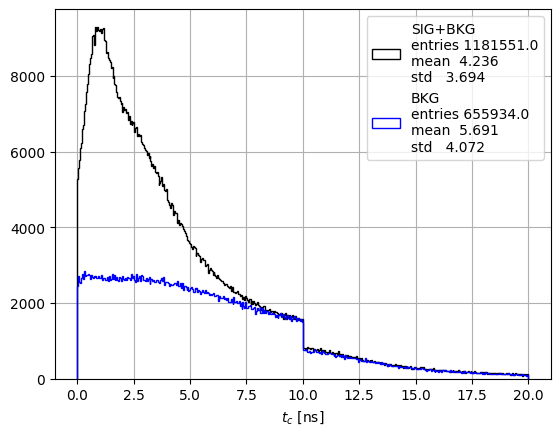

In [18]:
# --- Mean Hit Time (tc) per candidate, times shifted to min hit time ---
# tc = mean(t_i - t_min) for each candidate

tc_sig = []
for evCandidates in nicf_times.values():
    for candidate in evCandidates:
        t = np.array(candidate)
        t_shifted = t - t.min()
        tc_sig.append(t_shifted.mean())

tc_bkg = []
for evCandidates in bkg_times.values():
    for candidate in evCandidates:
        t = np.array(candidate)
        t_shifted = t - t.min()
        tc_bkg.append(t_shifted.mean())

pltext.hist(tc_sig, 500, range=(0, 20), density=False, xylabels="$t_c$ [ns]", label="SIG+BKG");
pltext.hist(tc_bkg, 500, range=(0, 20), density=False, xylabels="$t_c$ [ns]", label="BKG");

### Tc -- tRMS and nhits Cuts

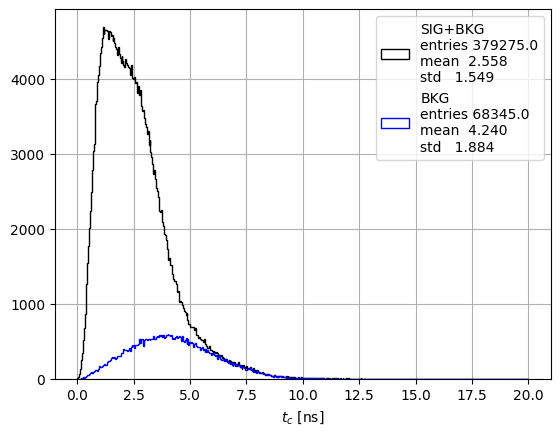

In [19]:
# --- Mean Hit Time (tc) per candidate, with cuts N20 > 3 and tRMS < 5 ns ---
NHITS_CUT = 3
TRMS_CUT  = 5

tc_sig_cuts = []
for evCandidates in nicf_times.values():
    for candidate in evCandidates:
        if len(candidate) > NHITS_CUT and np.std(candidate) < TRMS_CUT:
            t = np.array(candidate)
            t_shifted = t - t.min()
            tc_sig_cuts.append(t_shifted.mean())

tc_bkg_cuts = []
for evCandidates in bkg_times.values():
    for candidate in evCandidates:
        if len(candidate) > NHITS_CUT and np.std(candidate) < TRMS_CUT:
            t = np.array(candidate)
            t_shifted = t - t.min()
            tc_bkg_cuts.append(t_shifted.mean())

pltext.hist(tc_sig_cuts, 500, range=(0, 20), density=False, xylabels="$t_c$ [ns]", label="SIG+BKG");
pltext.hist(tc_bkg_cuts, 500, range=(0, 20), density=False, xylabels="$t_c$ [ns]", label="BKG");

# Purity

### Purity With No Cuts

In [39]:
noCandidates_sig = []
for evCandidates in nicf_times.values():
    noCandidates_sig.append(len(evCandidates))

noCandidates_bkg = []
for evCandidates in bkg_times.values():
    noCandidates_bkg.append(len(evCandidates))

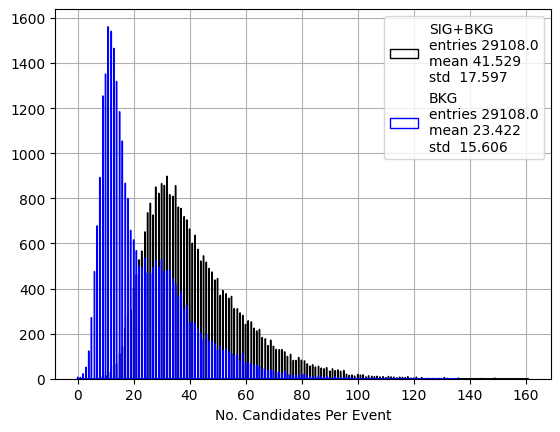

In [40]:
pltext.hist(noCandidates_sig, 1000, xylabels="No. Candidates Per Event", label="SIG+BKG");
pltext.hist(noCandidates_bkg, 1000, xylabels="No. Candidates Per Event", label="BKG");

In [41]:
print("Purity computed applying no cuts.")
print(f"Purity: {(np.mean(noCandidates_sig)-np.mean(noCandidates_bkg))/np.mean(noCandidates_sig)*100:.2f}%")

Purity computed applying no cuts.
Purity: 43.60%


### Purity After tRMS and N20 Cuts
Applying the same cuts used in the hist2d (cell 22): **N20 > 3** and **tRMS < 5 ns**.

In [42]:
# --- Rebuild per-event candidate lists applying the same cuts as hist2d ---
# Cuts: N20 > 3 AND tRMS < 5 ns
NHITS_CUT = 3   # strict: N20 > 3
TRMS_CUT  = 5   # strict: tRMS < 5 ns

noCandidates_sig_cuts = []
for evCandidates in nicf_times.values():
    count = 0
    for candidate in evCandidates:
        nhits = len(candidate)
        trms  = np.std(candidate)
        if nhits > NHITS_CUT and trms < TRMS_CUT:
            count += 1
    noCandidates_sig_cuts.append(count)

noCandidates_bkg_cuts = []
for evCandidates in bkg_times.values():
    count = 0
    for candidate in evCandidates:
        nhits = len(candidate)
        trms  = np.std(candidate)
        if nhits > NHITS_CUT and trms < TRMS_CUT:
            count += 1
    noCandidates_bkg_cuts.append(count)

--- No cuts ---
  Mean candidates/event  SIG+BKG : 41.5294
  Mean candidates/event  BKG     : 23.4219
  Purity                         : 43.60%

--- Cuts: N20 > 3, tRMS < 5 ns ---
  Mean candidates/event  SIG+BKG : 12.9673
  Mean candidates/event  BKG     : 2.6070
  Purity                         : 79.90%

  Signal efficiency              : 31.22%
  Background rejection           : 88.87%


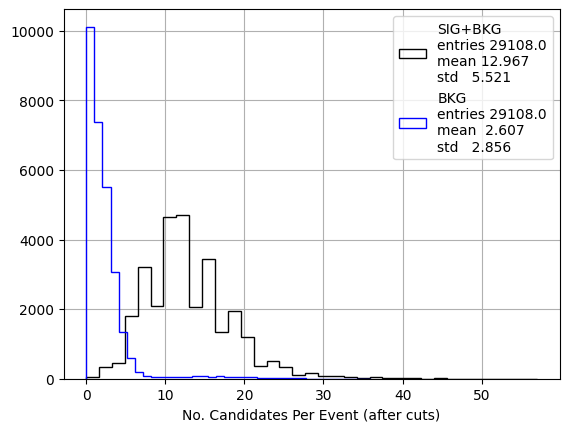

In [43]:
# --- Candidates per event after cuts ---
pltext.hist(noCandidates_sig_cuts, 35, xylabels="No. Candidates Per Event (after cuts)", label="SIG+BKG");
pltext.hist(noCandidates_bkg_cuts, 35, xylabels="No. Candidates Per Event (after cuts)", label="BKG");

# --- Purity before and after cuts ---
mean_sig_nocuts = np.mean(noCandidates_sig)
mean_bkg_nocuts = np.mean(noCandidates_bkg)
mean_sig_cuts   = np.mean(noCandidates_sig_cuts)
mean_bkg_cuts   = np.mean(noCandidates_bkg_cuts)

purity_nocuts = (mean_sig_nocuts - mean_bkg_nocuts) / mean_sig_nocuts * 100
purity_cuts   = (mean_sig_cuts   - mean_bkg_cuts  ) / mean_sig_cuts   * 100

print(f"--- No cuts ---")
print(f"  Mean candidates/event  SIG+BKG : {mean_sig_nocuts:.4f}")
print(f"  Mean candidates/event  BKG     : {mean_bkg_nocuts:.4f}")
print(f"  Purity                         : {purity_nocuts:.2f}%")
print()
print(f"--- Cuts: N20 > {NHITS_CUT}, tRMS < {TRMS_CUT} ns ---")
print(f"  Mean candidates/event  SIG+BKG : {mean_sig_cuts:.4f}")
print(f"  Mean candidates/event  BKG     : {mean_bkg_cuts:.4f}")
print(f"  Purity                         : {purity_cuts:.2f}%")
print()
print(f"  Signal efficiency              : {mean_sig_cuts / mean_sig_nocuts * 100:.2f}%")
print(f"  Background rejection           : {(1 - mean_bkg_cuts / mean_bkg_nocuts) * 100:.2f}%")

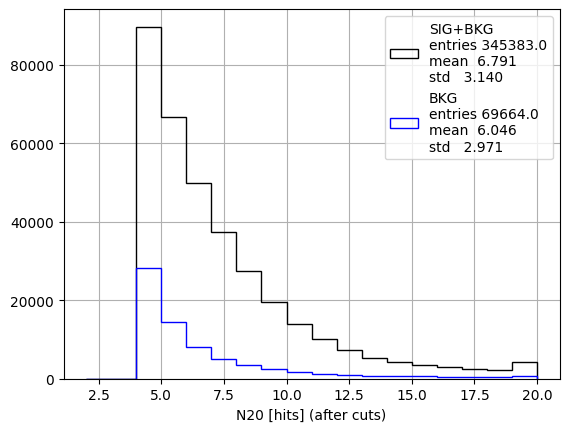

In [44]:
# --- N20 distribution for surviving candidates (N20 > 3, tRMS < 5 ns) ---
NHITS_CUT = 3
TRMS_CUT  = 5

nhits_sig_cuts = []
for evCandidates in nicf_times.values():
    for candidate in evCandidates:
        if len(candidate) > NHITS_CUT and np.std(candidate) < TRMS_CUT:
            nhits_sig_cuts.append(len(candidate))

nhits_bkg_cuts = []
for evCandidates in bkg_times.values():
    for candidate in evCandidates:
        if len(candidate) > NHITS_CUT and np.std(candidate) < TRMS_CUT:
            nhits_bkg_cuts.append(len(candidate))

pltext.hist(nhits_sig_cuts, 18, range=(2, 20), xylabels="N20 [hits] (after cuts)", label="SIG+BKG");
pltext.hist(nhits_bkg_cuts, 18, range=(2, 20), xylabels="N20 [hits] (after cuts)", label="BKG");

### Purity After tRMS, N20 and Tc Cuts
Applying the same cuts used in the hist2d (cell 22): **N20 > 3**, **tRMS < 5 ns** and **tc < 3 ns**.

--- Cuts: N20 > 3, tRMS < 5 ns, tc < 3 ns ---
  Mean candidates/event  SIG+BKG : 5.5325
  Mean candidates/event  BKG     : 0.6885
  Purity                          : 87.56%

  Signal efficiency (vs no cuts)           : 13.32%
  Background rejection (vs no cuts)        : 97.06%

  Signal efficiency (vs tRMS+N20 cuts)     : 42.67%
  Background rejection (vs tRMS+N20 cuts)  : 73.59%


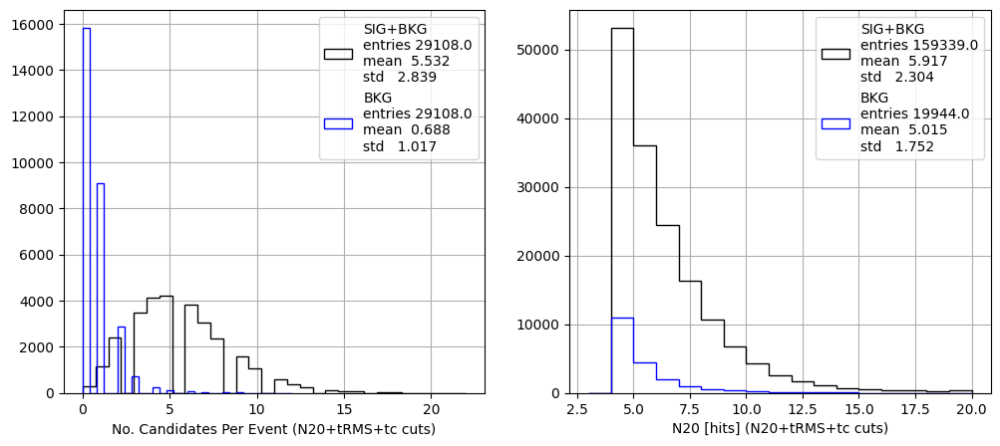

In [45]:
# --- Purity with additional tc cut ---
NHITS_CUT = 3
TRMS_CUT  = 5
TC_CUT    = 3  # tc < 3 ns

noCandidates_sig_tc = []
for evCandidates in nicf_times.values():
    count = 0
    for candidate in evCandidates:
        t = np.array(candidate)
        if len(t) > NHITS_CUT and np.std(t) < TRMS_CUT:
            tc = (t - t.min()).mean()
            if tc < TC_CUT:
                count += 1
    noCandidates_sig_tc.append(count)

noCandidates_bkg_tc = []
for evCandidates in bkg_times.values():
    count = 0
    for candidate in evCandidates:
        t = np.array(candidate)
        if len(t) > NHITS_CUT and np.std(t) < TRMS_CUT:
            tc = (t - t.min()).mean()
            if tc < TC_CUT:
                count += 1
    noCandidates_bkg_tc.append(count)

# --- Plots ---
subplot = pltext.canvas(2)

subplot(1)
pltext.hist(noCandidates_sig_tc, 30, xylabels="No. Candidates Per Event (N20+tRMS+tc cuts)", label="SIG+BKG");
pltext.hist(noCandidates_bkg_tc, 30, xylabels="No. Candidates Per Event (N20+tRMS+tc cuts)", label="BKG");

subplot(2)
nhits_sig_tc = []
nhits_bkg_tc = []
for evCandidates in nicf_times.values():
    for candidate in evCandidates:
        t = np.array(candidate)
        if len(t) > NHITS_CUT and np.std(t) < TRMS_CUT and (t - t.min()).mean() < TC_CUT:
            nhits_sig_tc.append(len(t))
for evCandidates in bkg_times.values():
    for candidate in evCandidates:
        t = np.array(candidate)
        if len(t) > NHITS_CUT and np.std(t) < TRMS_CUT and (t - t.min()).mean() < TC_CUT:
            nhits_bkg_tc.append(len(t))

pltext.hist(nhits_sig_tc, 17, range=(3, 20), xylabels="N20 [hits] (N20+tRMS+tc cuts)", label="SIG+BKG");
pltext.hist(nhits_bkg_tc, 17, range=(3, 20), xylabels="N20 [hits] (N20+tRMS+tc cuts)", label="BKG");

# --- Purity ---
mean_sig_tc = np.mean(noCandidates_sig_tc)
mean_bkg_tc = np.mean(noCandidates_bkg_tc)
purity_tc   = (mean_sig_tc - mean_bkg_tc) / mean_sig_tc * 100

print(f"--- Cuts: N20 > {NHITS_CUT}, tRMS < {TRMS_CUT} ns, tc < {TC_CUT} ns ---")
print(f"  Mean candidates/event  SIG+BKG : {mean_sig_tc:.4f}")
print(f"  Mean candidates/event  BKG     : {mean_bkg_tc:.4f}")
print(f"  Purity                          : {purity_tc:.2f}%")
print()
print(f"  Signal efficiency (vs no cuts)           : {mean_sig_tc / np.mean(noCandidates_sig) * 100:.2f}%")
print(f"  Background rejection (vs no cuts)        : {(1 - mean_bkg_tc / np.mean(noCandidates_bkg)) * 100:.2f}%")
print()
print(f"  Signal efficiency (vs tRMS+N20 cuts)     : {mean_sig_tc / np.mean(noCandidates_sig_cuts) * 100:.2f}%")
print(f"  Background rejection (vs tRMS+N20 cuts)  : {(1 - mean_bkg_tc / np.mean(noCandidates_bkg_cuts)) * 100:.2f}%")

# DF Creation

In [14]:
# --- Build DataFrames with candidates passing all cuts ---
# Cuts: N20 > 3, tRMS < 5 ns, tc < 3 ns

NHITS_CUT     = 2
TRMS_CUT_INF  = 2
TRMS_CUT_SUP  = 0
TC_CUT        = 10

def build_candidates_df(trigger_indices, trigger_times,
                        calib_times, hit_charges,
                        hit_slot_ids, hit_position_ids):
    rows = []
    global_cand_id = 0

    for ev, candidates in tqdm(trigger_indices.items(), total=len(trigger_indices)):
        for hit_indices, candidate in zip(candidates, trigger_times[ev]):

            t = np.array(candidate)
            # if len(t) <= NHITS_CUT:             continue
            if np.std(t) >= TRMS_CUT_INF:       continue
            # if np.std(t) <= TRMS_CUT_SUP:       continue
            # if (t - t.min()).mean() >= TC_CUT:  continue

            ev_times   = ak.to_numpy(calib_times[ev])
            ev_charges = ak.to_numpy(hit_charges[ev])
            ev_slots   = ak.to_numpy(hit_slot_ids[ev])
            ev_pos     = ak.to_numpy(hit_position_ids[ev])

            for idx in hit_indices:
                rows.append({
                    "event_id"                : ev,
                    "candidate_id"            : global_cand_id,
                    "hit_pmt_calibrated_times": ev_times  [idx],
                    "hit_pmt_charges"         : ev_charges[idx],
                    "hit_mpmt_slot_ids"       : ev_slots  [idx],
                    "hit_pmt_position_ids"    : ev_pos    [idx],
                })

            global_cand_id += 1

    return pd.DataFrame(rows)


df_sig = build_candidates_df(
    trigger_indices  = nicf_indices,
    trigger_times    = nicf_times,
    calib_times      = nicf_run_tof_corrected_times,
    hit_charges      = nicf_run_tof_hit_charges,
    hit_slot_ids     = nicf_run_tof_hit_slot_ids,
    hit_position_ids = nicf_run_tof_hit_position_ids,
)

df_bkg = build_candidates_df(
    trigger_indices  = bkg_indices,
    trigger_times    = bkg_times,
    calib_times      = bkg_run_corrected_times,
    hit_charges      = bkg_run_hit_charges,
    hit_slot_ids     = bkg_run_hit_slot_ids,
    hit_position_ids = bkg_run_hit_position_ids,
)

print(f"df_sig: {len(df_sig)} hits, "
      f"{df_sig.groupby(['event_id','candidate_id']).ngroups} candidates")
print(f"df_bkg: {len(df_bkg)} hits, "
      f"{df_bkg.groupby(['event_id','candidate_id']).ngroups} candidates")

# print()
# print(df_sig.head())
# print(df_bkg.head())

100%|██████████| 11113/11113 [00:33<00:00, 331.55it/s]


df_sig: 475292 hits, 131149 candidates
df_bkg: 142768 hits, 58081 candidates


In [7]:
df_sig["pmt_id"] = df_sig["hit_mpmt_slot_ids"]*19 + df_sig["hit_pmt_position_ids"]
df_bkg["pmt_id"] = df_bkg["hit_mpmt_slot_ids"]*19 + df_bkg["hit_pmt_position_ids"]

In [8]:
# df_sig.to_csv("/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/hk/nicf_data/data/analysis_files/df_sigFromKaMing_forClaudeReco_noCuts_VVV.csv")
# df_bkg.to_csv("/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/hk/nicf_data/data/analysis_files/df_bkgFromKaMing_forClaudeReco_noCuts_VVV.csv")
# df_bump.to_csv("data_files/df_bumpFromKaMing_forClaudeReco.csv")

# Desplegables

In [9]:
from WCTE_event_display.EventDisplay import EventDisplay
import matplotlib.colors as colors

#1) make an instance of the event display class
eventDisplay = EventDisplay() 

#2) start by loading in the CSV file for how the mPMTs are mapped to 2d event display
#unwraps based on the mPMT slot ID 
eventDisplay.load_mPMT_positions('mPMT_2D_projection_angles.csv')

#mask out mPMT slots - newer WCSim doesn't have these mPMTs loaded  
#WCTE slot numbering
# eventDisplay.mask_mPMTs([45,77,79,27,32,85,91,99,12,14,16,18])
#WCSim container numbering
# eventDisplay.mask_mPMTs([20,73,38,49,55,65,67,33,71,92,101,95])

#3) load the WCSim mapping tube no to slot number
#for WCSim using the numpy output we need the mapping between the tube_number in WCSim and the slot and mPMT number in the detector
#this can be obtained from the geofile that WCSim produces 
#This changes if the CDS is implemented or not
eventDisplay.load_wcsim_tubeno_mapping("/mnt/netapp2/Store_uni/home/usc/ie/dcr/software/hk/WCSim/install/geofile_NuPRISMBeamTest_16cShort_mPMT.txt")

(2014,)
(2014,)


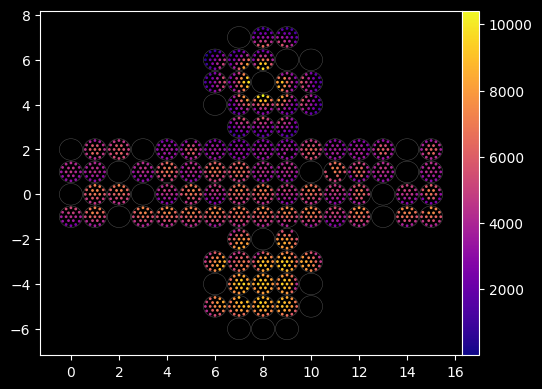

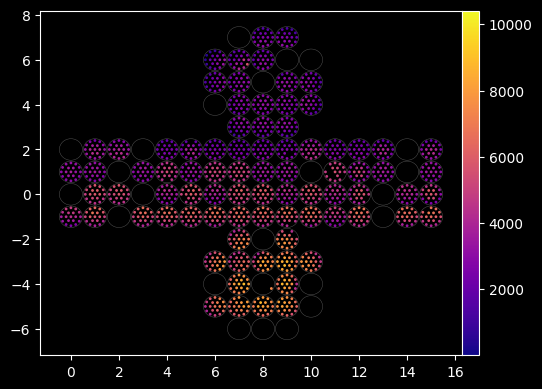

In [12]:
import matplotlib.colors as colors

n_pmts = 2014

# --- Calculamos la escala global según df_sig ---
nhits_sig = df_sig.groupby("pmt_id")["hit_pmt_charges"].count().reindex(range(n_pmts), fill_value=0).values.astype(float)
vmin = 1e-1  # mínimo positivo para LogNorm (evitar log(0))
vmax = nhits_sig.max()  # máximo para escalar

# --- df_sig ---
eventDisplay.plotEventDisplay(
    nhits_sig,
    color_norm=colors.Normalize(vmin=vmin, vmax=vmax),
    style="dark_background"
)

# --- df_bkg ---
nhits_bkg = df_bkg.groupby("pmt_id")["hit_pmt_charges"].count().reindex(range(n_pmts), fill_value=0).values.astype(float)
eventDisplay.plotEventDisplay(
    nhits_bkg,
    color_norm=colors.Normalize(vmin=vmin, vmax=vmax),
    style="dark_background"
)

# # --- df_bump ---
# nhits_bump = df_bump.groupby("pmt_id")["hit_pmt_charges"].count().reindex(range(n_pmts), fill_value=0).values.astype(float)
# eventDisplay.plotEventDisplay(
#     nhits_bump,
#     color_norm=colors.Normalize(vmin=vmin, vmax=vmax),
#     style="dark_background"
# )

plt.style.use('default');
pltext.style()

# Charge Calibration

In [33]:
def plotCharges(df):
    subplot = pltext.canvas(19)
    for pmt in range(19):
        charge = df[df["pmt_id"].values == pmt]["hit_pmt_charges"].values
        subplot(pmt+1)
        pltext.hist(charge, 100, range=(0, 1e3), stats=False, xylabels=f"Hit Charge In PMT #{pmt} [ADC]");


In [34]:
plt.style.use('default');
pltext.style()

# plotCharges(df_sig)
# plotCharges(df_bkg)

In [35]:
subplot = pltext.canvas(19)
mean_charge = []
mean_charge_err = []
for pmt in tqdm(range(2014), total=2014):
    charge = df_sig[df_sig["pmt_id"].values == pmt]["hit_pmt_charges"].values
    # subplot(pmt+1)
    # pltext.hist(charge, 100, range=(0, 1e3), stats=False, xylabels=f"Hit Charge In PMT #{pmt} [ADC]");
    try:
        h = pltext.hfit(charge, 100, "gaus", range=(75,210));
    except:
        mean_charge.append(np.nan)
        mean_charge_err.append(np.nan)
        continue
    plt.close()
    mean_charge.append(h[3][1])
    mean_charge_err.append(h[4][1])

  1%|          | 12/2014 [00:00<02:00, 16.57it/s]

  2%|▏         | 49/2014 [00:01<00:57, 34.37it/s]/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/software/python_envs/py39_venv/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: divide by zero encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/mnt/lustre/scratch/nlsas/home/usc/ie/dcr/software/python_envs/py39_venv/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/mnt/netapp2/Store_uni/home/usc/ie/dcr/software/hk/hipy/hipy/cfit.py:91: OptimizeWarning: Covariance of the parameters could not be estimated
  pars, fcov = optimize.curve_fit(cfun, x, y, p0 = cp0, sigma = sigma,
100%|██████████| 2014/2014 [01:06<00:00, 30.20it/s]


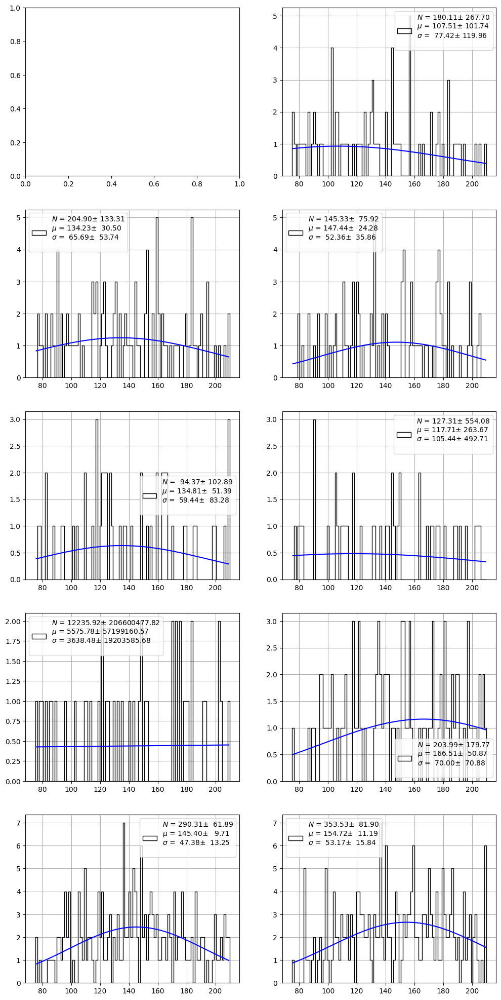

In [36]:
subplot = pltext.canvas(10)
for pmt in range(10):
    charge = df_sig[df_sig["pmt_id"].values == pmt]["hit_pmt_charges"].values
    subplot(pmt+1)
    # pltext.hist(charge, 100, range=(0, 1e3), stats=False, xylabels=f"Hit Charge In PMT #{pmt} [ADC]");
    try:
        h = pltext.hfit(charge, 100, "gaus", range=(75, 210));
    except:
        continue
    

In [37]:
np.mean(mean_charge), np.sqrt(np.sum(np.array(mean_charge_err)**2))/len(mean_charge_err)

(np.float64(nan), np.float64(nan))

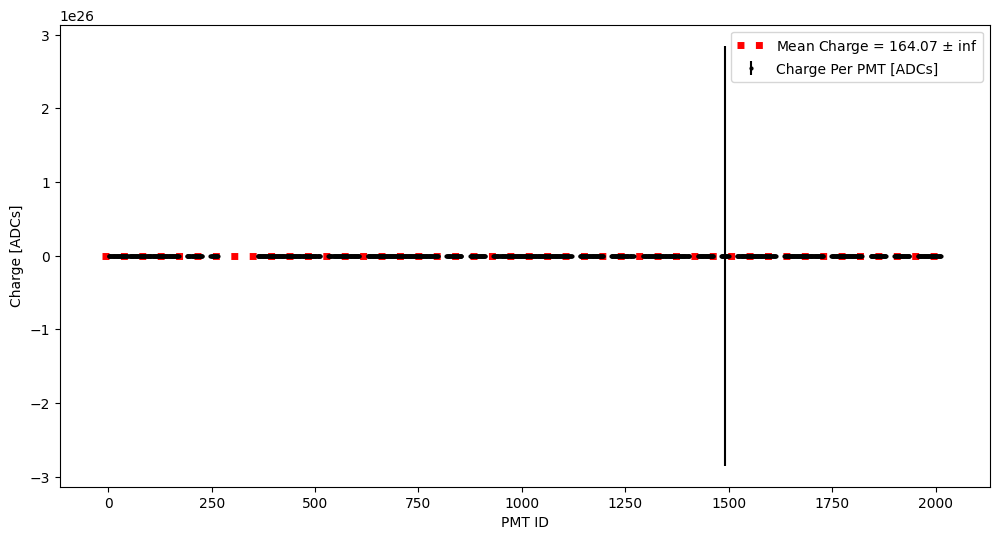

In [38]:
fig = plt.figure(figsize=(12, 6))
plt.errorbar(range(2014), mean_charge, yerr=mean_charge_err, fmt='o', markersize=2, label="Charge Per PMT [ADCs]");
# plt.ylim(110, 175);
plt.hlines(np.nanmean(mean_charge), -15, 2029, linestyles=":", color="red", linewidth=5,label=f"Mean Charge = {np.nanmean(mean_charge):.2f} $\pm$ {np.nanmean(mean_charge_err):.2f}");
plt.xlabel("PMT ID");
plt.ylabel("Charge [ADCs]");
plt.legend();

In [39]:
subplot = pltext.canvas(19)
mean_charge = []
mean_charge_err = []
for pmt in tqdm(range(2014), total=2014):
    charge = df_sig[df_sig["pmt_id"].values == pmt]["hit_pmt_charges"].values
    # subplot(pmt+1)
    # pltext.hist(charge, 100, range=(0, 1e3), stats=False, xylabels=f"Hit Charge In PMT #{pmt} [ADC]");
    try:
        h = pltext.hfit(charge, 100, "gaus", range=(50, 250));
    except:
        mean_charge.append(np.nan)
        mean_charge_err.append(np.nan)
        continue
    plt.close()
    mean_charge.append(h[3][1])
    mean_charge_err.append(h[4][1])

100%|██████████| 2014/2014 [00:42<00:00, 46.88it/s] 


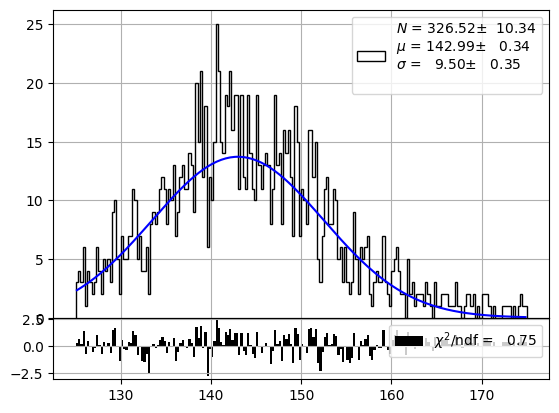

In [40]:
# pltext.hist([i for i in mean_charge if i!=0], 1000);
pltext.hfit(mean_charge, 200, 'gaus', range=(125, 175), residuals=True, xylabels="Mean Charge Per PMT [ADC]");

# Afterpulsing Analysis

In [41]:
nicf_times

{0: [array([8128.04287133, 8145.39237982]),
  array([87565.73891368, 87567.71255209]),
  array([135052.6392901 , 135053.68855572, 135053.80368957, 135054.50301224,
         135056.81151801]),
  array([173445.04875497, 173445.41393122, 173446.33644786, 173454.20238212,
         173470.90652207]),
  array([182943.18916607, 182946.41471724, 182947.46589121, 182948.88960715]),
  array([194965.32105159, 194965.56013045]),
  array([230107.64087702, 230108.8028828 , 230109.09253402, 230109.35183602,
         230109.42996277, 230109.93554874, 230111.22093957, 230111.38226419,
         230111.42885639, 230111.57643516, 230111.83418035, 230112.12888488,
         230112.50958832, 230112.62498785, 230116.57222154, 230117.46419398,
         230117.53601627, 230126.02443796, 230133.91117871]),
  array([230638.02444041, 230638.20759869]),
  array([245403.16826627, 245403.31103669, 245403.94774359, 245404.16136765,
         245404.33536857, 245404.36739868, 245404.51637819, 245404.53445962,
         2

# Read DFs And Play Again

In [42]:
df_sig = pd.read_csv("data_files/df_sigFromKaMing_forClaudeReco.csv")
df_bkg = pd.read_csv("data_files/df_bkgFromKaMing_forClaudeReco.csv")
df_bump = pd.read_csv("data_files/df_bumpFromKaMing_forClaudeReco.csv")

In [43]:
df_sig

,Unnamed: 0,event_id,candidate_id,hit_pmt_calibrated_times,hit_pmt_charges,hit_mpmt_slot_ids,hit_pmt_position_ids,pmt_id
0,0,0,0,65913.196181,75.0,69,17,1328
1,1,0,0,65913.202297,137.0,70,1,1331
2,2,0,0,65913.385377,77.0,75,6,1431
3,3,0,0,65913.529539,101.0,54,9,1035
4,4,0,0,65913.912451,353.0,57,6,1089
...,...,...,...,...,...,...,...,...
1887400,1887400,47108,284159,246554.602468,200.0,65,11,1246
1887401,1887401,47108,284160,292618.984835,104.0,24,13,469
1887402,1887402,47108,284160,292619.252065,84.0,55,14,1059
1887403,1887403,47108,284160,292619.611487,159.0,86,13,1647


In [44]:
df_bump

,Unnamed: 0,event_id,candidate_id,hit_pmt_calibrated_times,hit_pmt_charges,hit_mpmt_slot_ids,hit_pmt_position_ids,pmt_id
0,0,1,0,233471.803926,121.0,80,6,1526
1,1,1,0,233472.085767,197.0,65,4,1239
2,2,1,0,233472.183021,259.0,81,1,1540
3,3,1,0,233472.527832,258.0,80,3,1523
4,4,1,0,233472.629435,200.0,80,15,1535
...,...,...,...,...,...,...,...,...
1188023,1188023,47105,124742,330994.063633,190.0,0,18,18
1188024,1188024,47105,124743,425079.494322,193.0,1,1,20
1188025,1188025,47105,124743,425079.748202,109.0,38,17,739
1188026,1188026,47105,124743,425084.756046,86.0,24,4,460


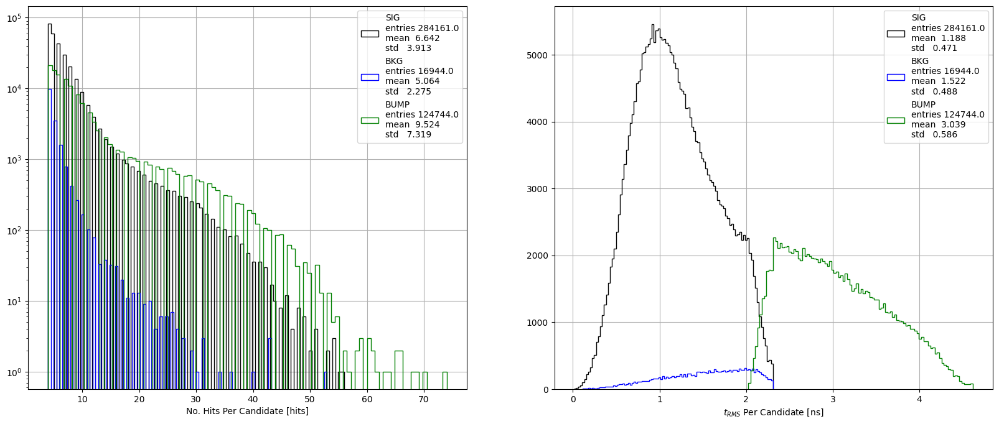

In [45]:
nhits_perCandidate_sig = df_sig.groupby("candidate_id")["event_id"].count().values
nhits_perCandidate_bkg = df_bkg.groupby("candidate_id")["event_id"].count().values
nhits_perCandidate_bump = df_bump.groupby("candidate_id")["event_id"].count().values

trms_perCandidate_sig = df_sig.groupby("candidate_id")["hit_pmt_calibrated_times"].std().values
trms_perCandidate_bkg = df_bkg.groupby("candidate_id")["hit_pmt_calibrated_times"].std().values
trms_perCandidate_bump = df_bump.groupby("candidate_id")["hit_pmt_calibrated_times"].std().values
subplot = pltext.canvas(2,2,8,10)

subplot(1)
pltext.hist(nhits_perCandidate_sig, 100, ylog=True, label="SIG", xylabels="No. Hits Per Candidate [hits]");
pltext.hist(nhits_perCandidate_bkg, 100, ylog=True, label="BKG", xylabels="No. Hits Per Candidate [hits]");
pltext.hist(nhits_perCandidate_bump, 100, ylog=True, label="BUMP", xylabels="No. Hits Per Candidate [hits]");

subplot(2)
pltext.hist(trms_perCandidate_sig, 100, ylog=False, label="SIG", xylabels="$t_{RMS}$ Per Candidate [ns]");
pltext.hist(trms_perCandidate_bkg, 100, ylog=False, label="BKG", xylabels="$t_{RMS}$ Per Candidate [ns]");
pltext.hist(trms_perCandidate_bump, 100, ylog=False, label="BUMP", xylabels="$t_{RMS}$ Per Candidate [ns]");